# Imports & Config

In [4]:
import os, shutil, argparse, random, pickle, cv2, fnmatch, PIL, math, signal
from tqdm import tqdm_notebook as tqdm
import tensorflow as tf
import tensorflow.keras as k
import numpy as np
import pandas as pd
from sklearn.utils import shuffle
from tensorflow.keras.optimizers import RMSprop, Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.preprocessing import image
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.metrics import auc
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import datetime

%matplotlib inline

print('[INFO] Imports done.  Using Tensorflow version: {}, and Keras version: {}'.format(tf.__version__, k.__version__))

[INFO] Imports done.  Using Tensorflow version: 1.13.1, and Keras version: 2.2.4-tf


In [5]:
config={}

config['do_dataprep'] = False

config['source'] = os.path.join(os.getcwd(), 'source_data')
config['home_dir'] = os.path.join(os.getcwd(), 'data_binary_split')

config['train_dir'] = os.path.join(os.getcwd(), 'data_binary_split', 'train')
config['test_dir'] = os.path.join(os.getcwd(), 'data_binary_split', 'test')
config['val_dir'] = os.path.join(os.getcwd(), 'data_binary_split', 'validation')

config['train_pain'] = os.path.join(config['train_dir'], 'pain')
config['train_nopain'] = os.path.join(config['train_dir'], 'nopain')
config['test_pain'] = os.path.join(config['test_dir'], 'pain')
config['test_nopain'] = os.path.join(config['test_dir'], 'nopain')
config['val_pain'] = os.path.join(config['val_dir'], 'pain')
config['val_nopain'] = os.path.join(config['val_dir'], 'nopain')

config['val_split'] = 0.1
config['test_split'] = 0.1

config['target_size'] = (320, 240)

config['train_batch'] = 100
config['test_batch'] = 100
config['val_batch'] = 100

config['epochs'] = 3

config['set_limit'] = True
config['limit'] = 1200

In [55]:
# get list of all images in pain train
# get the first 4
# display them

# Looking at the data we split

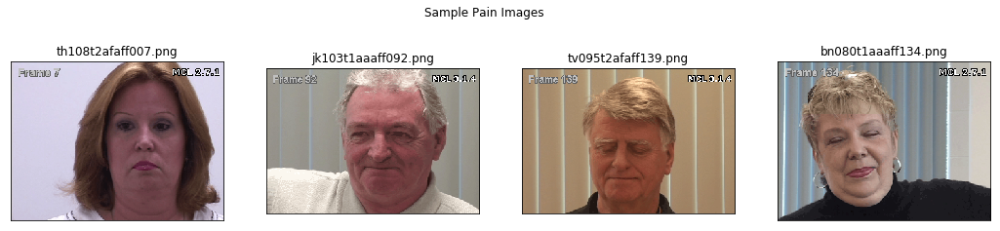

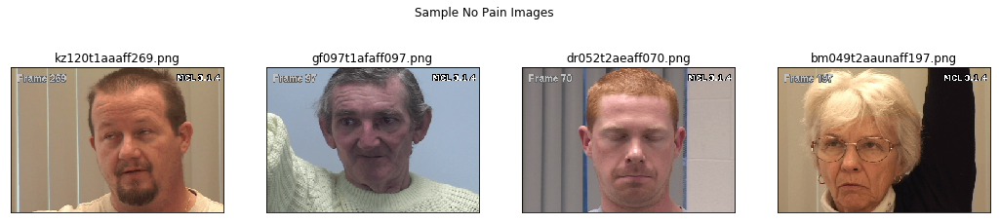

In [56]:
pain_file_list = os.listdir(config['train_pain'])

fig = plt.figure(figsize=(18,4))
# fig.subplots_adjust(top=0.99)
for i in np.arange(1,5):
    plt.subplot(1, 4, i)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(mpimg.imread(os.path.join(config['train_pain'], pain_file_list[i])))#, cmap=plt.cm.binary)
    plt.title(pain_file_list[i])

fig.suptitle('Sample Pain Images')
plt.show()

nopain_file_list = os.listdir(config['train_nopain'])

fig = plt.figure(figsize=(18,4))
# fig.subplots_adjust(top=0.99)
for i in np.arange(1,5):
    plt.subplot(1, 4, i)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(mpimg.imread(os.path.join(config['train_nopain'], nopain_file_list[i])))#, cmap=plt.cm.binary)
    plt.title(nopain_file_list[i])

fig.suptitle('Sample No Pain Images')
plt.show()

# Looking at the original data

In [57]:
def show_some_images(seed = 1984, number = '0.0'): 
    pain_file_list = os.listdir(os.path.join(config['source'],number))

    fig = plt.figure(figsize=(18,9))
    # fig.subplots_adjust(top=0.99)
    for i in np.arange(1,21):
        plt.subplot(4, 5, i)
        plt.xticks([])
        plt.yticks([])
        random.seed(seed)
        j = random.randint(0,len(pain_file_list)-1)
        plt.imshow(mpimg.imread(os.path.join(config['source'],number, pain_file_list[j])))#, cmap=plt.cm.binary)
        plt.title(pain_file_list[j])
        seed=seed+1

    fig.suptitle('Sample Images from {}'.format(number))
#     plt.show()
    
    plt.savefig(os.path.join(thumb_path, 'Sample Images from {}.png'.format(number)))
# show_some_images(seed = 1984, number = '9.0')

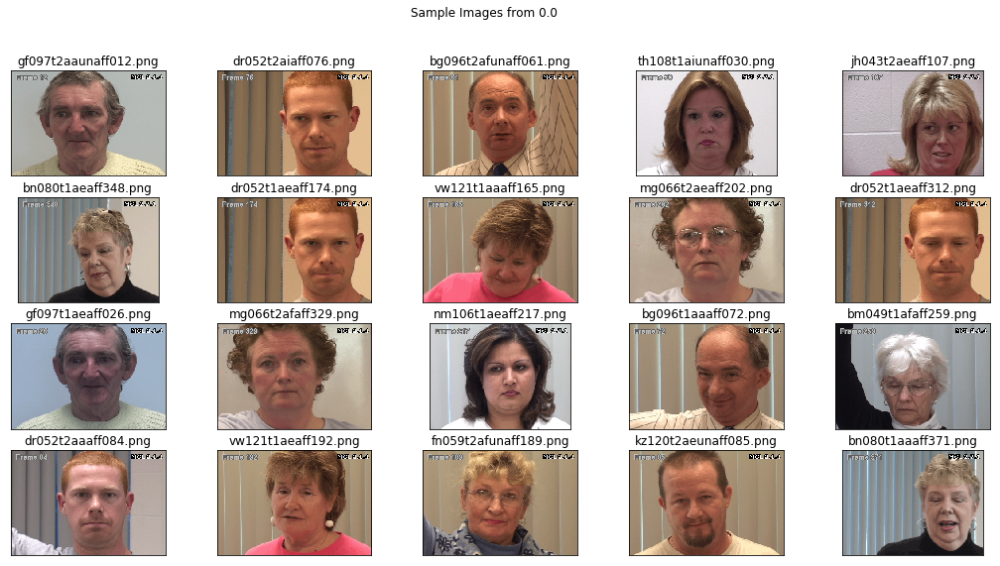

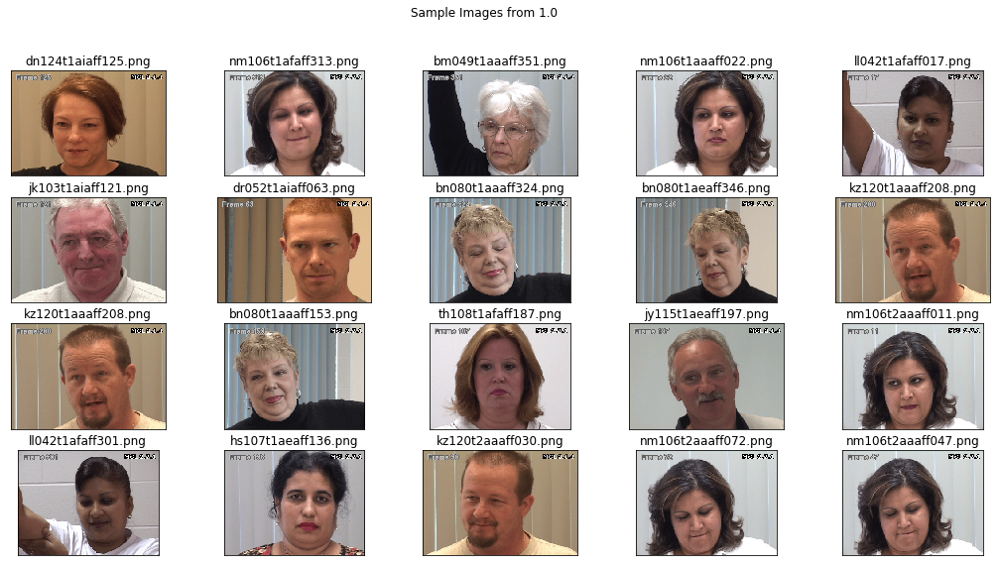

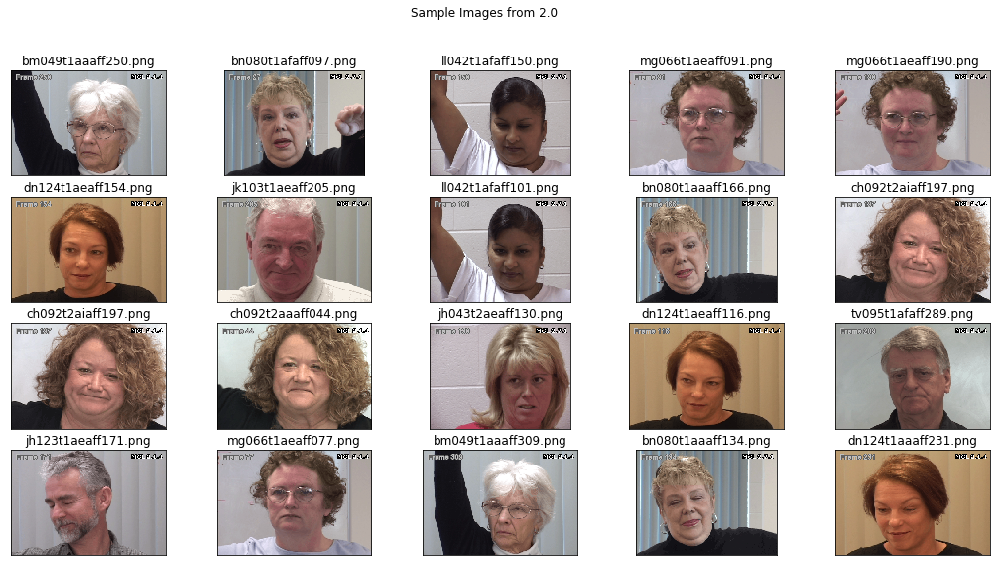

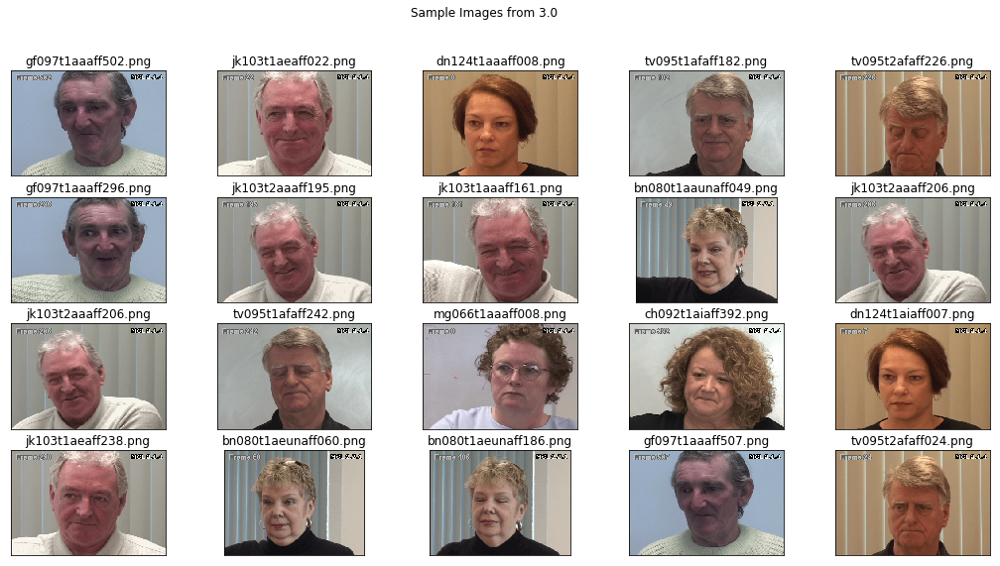

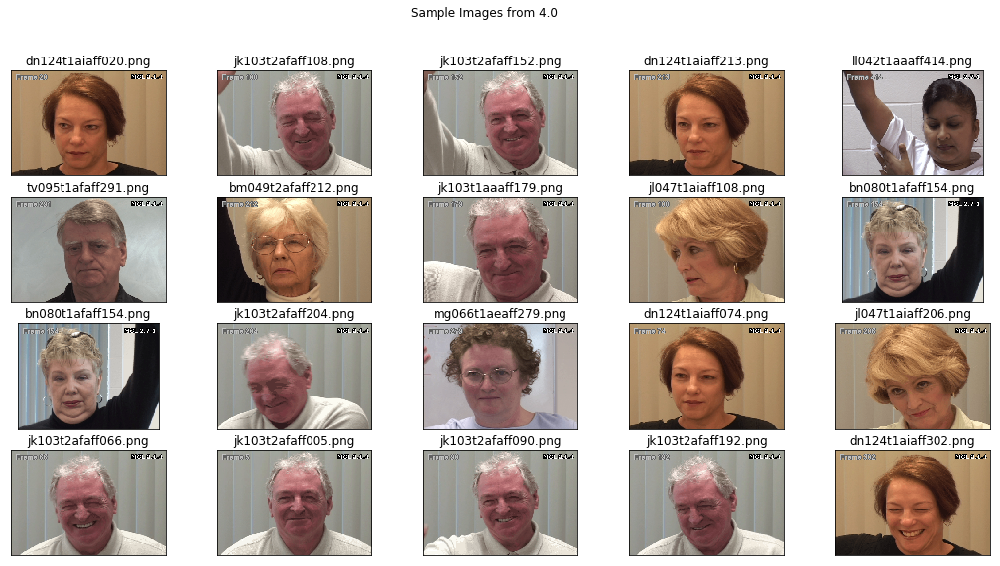

...

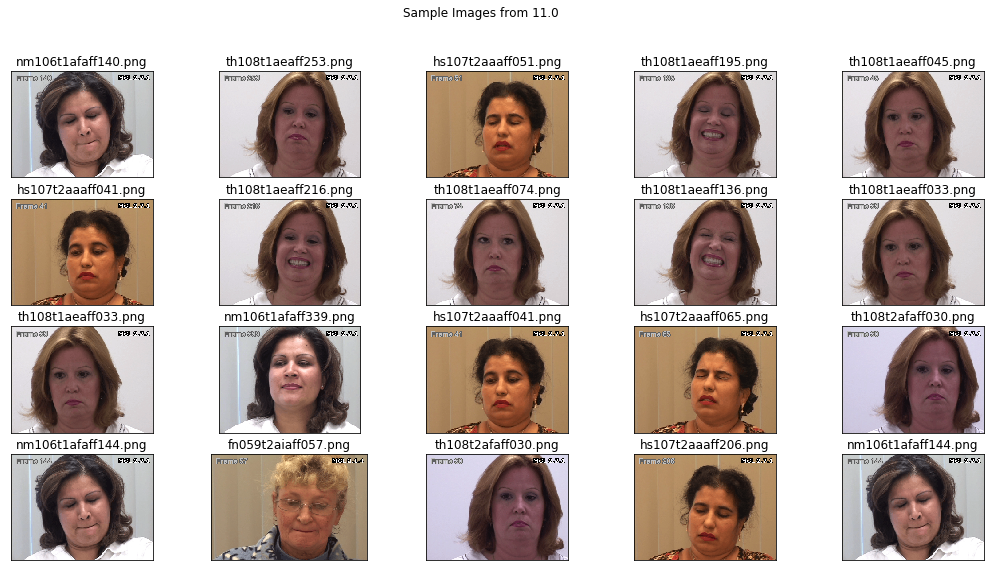

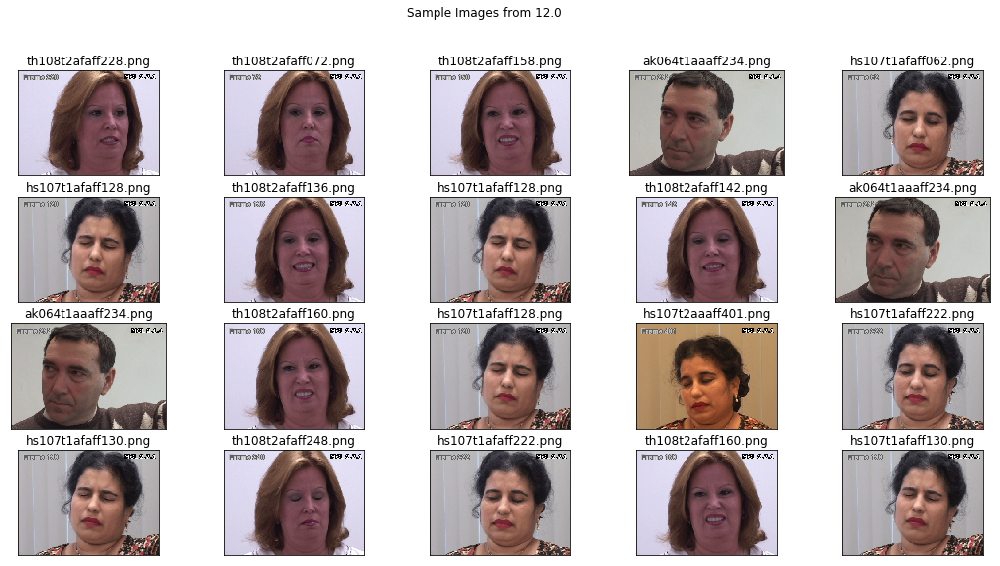

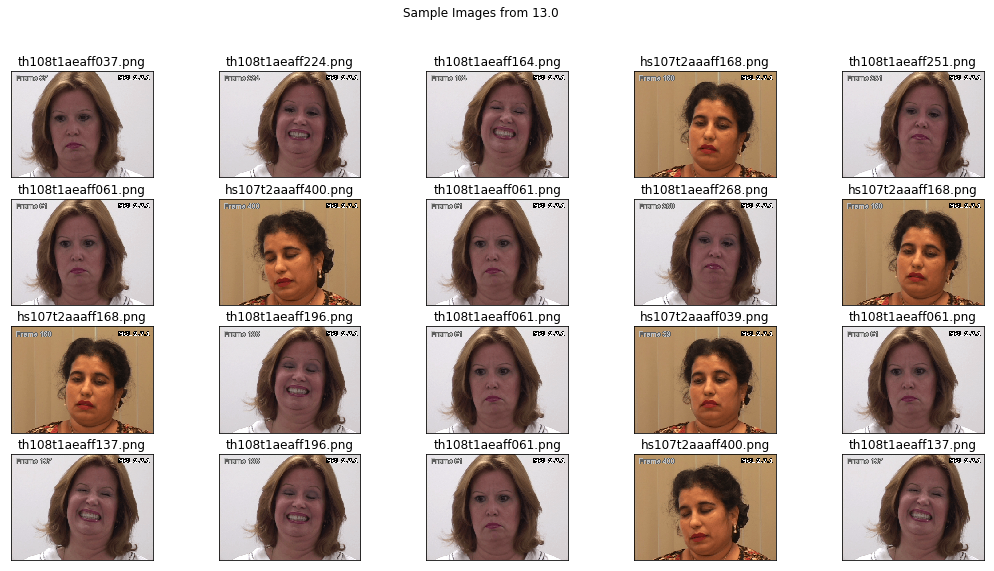

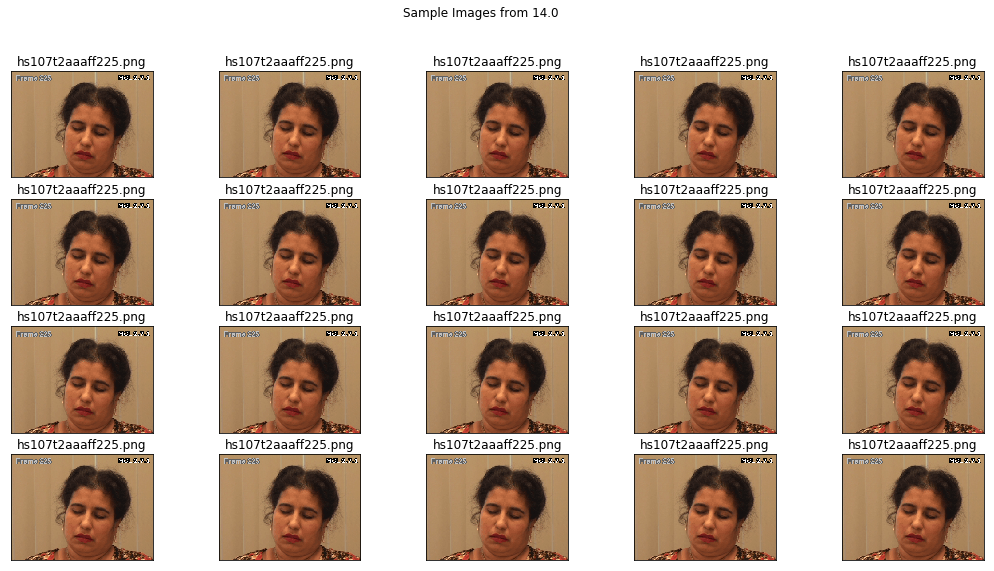

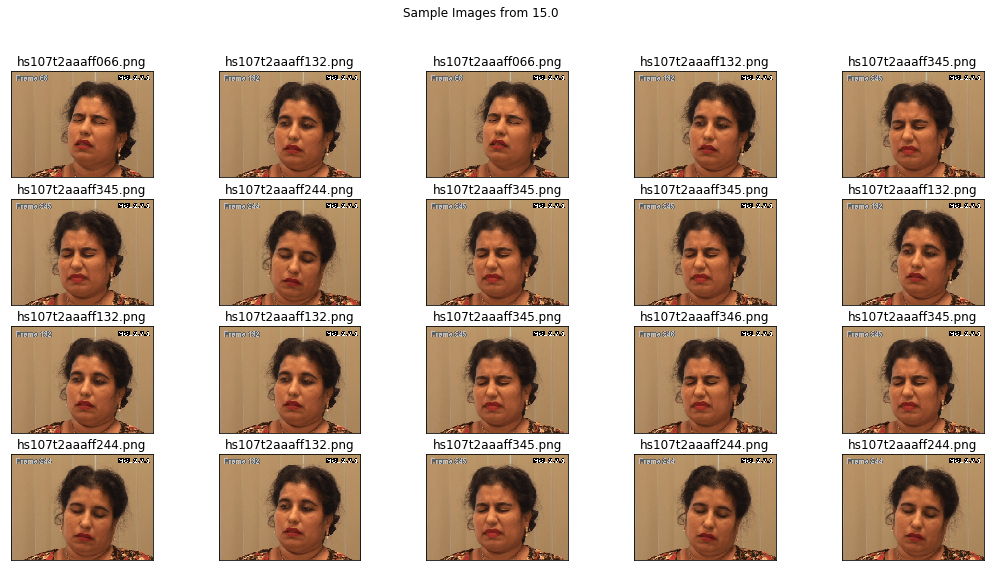

In [58]:
thumb_path = os.path.join(os.getcwd(), 'marks-runs', 'thumbnails')
if os.path.exists(thumb_path):
    shutil.rmtree(thumb_path)
os.mkdir(thumb_path)

for i in range(0, 16): 
    number = '{}.0'.format(i)
    show_some_images(seed=1984, number = number)